In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster # for clustering the markers
# cluster
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
# metrics
from sklearn import metrics
warnings.filterwarnings('ignore')

# Introduction

Users segmentation enables Yelp to customize its relationship with users and provides a better service. In this project, I'll use several unsupervised learning techniques to cluster users based on the 'favorite index' and identify favorite types of resturant the cluster of people share. By doing this, Yelp can give resturant recommendation to a user by identidy which cluster this user belongs to based on his/her past review records.

Favorite index is the score that used to indentify how much the user likes this type of food. <br>
<b>Favorite Index = Frequency * log(Stars+1)</b> <br>Frequency: the times users went to the type of restuarant <br>Stars: rated score for a specific resturant from a category she/he went to

# Data

The NV_reviews_business dataset has all reviews(scores + text) for different business in Nevada. I'll only consider the restaurant still opened.

In [2]:
reviews = pd.read_csv('NV_reviews_business_final.csv')

In [3]:
reviews.head()

,user_id,business_id,review_stars,text,date,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,hours,category1,category2,category3
0,5vD2kmE25YBrbayKhykNxQ,nlxHRv1zXGT0c0K51q3jDg,5,This is definitely my favorite fast food sub s...,2013-05-07 07:25:25,Firehouse Subs,"510 Marks St, Unit B-1, Ste 110",Henderson,NV,89014.0,36.059969,-115.036032,3.0,93,1,"{'Ambience': ""{'romantic': False, 'intimate': ...","{'Monday': '10:30-21:0', 'Tuesday': '10:30-21:...",Restaurants,Delis,Sandwiches
1,HQF6pQ9mC52J3BEEDSevOw,nlxHRv1zXGT0c0K51q3jDg,1,Ordered a specialty hot club and got home to f...,2018-08-23 20:58:18,Firehouse Subs,"510 Marks St, Unit B-1, Ste 110",Henderson,NV,89014.0,36.059969,-115.036032,3.0,93,1,"{'Ambience': ""{'romantic': False, 'intimate': ...","{'Monday': '10:30-21:0', 'Tuesday': '10:30-21:...",Restaurants,Delis,Sandwiches
2,3LNhTD4DIRPzPy2h7ZG1VQ,nlxHRv1zXGT0c0K51q3jDg,1,"The absolute worst, the girl at the counter wa...",2018-03-15 20:53:07,Firehouse Subs,"510 Marks St, Unit B-1, Ste 110",Henderson,NV,89014.0,36.059969,-115.036032,3.0,93,1,"{'Ambience': ""{'romantic': False, 'intimate': ...","{'Monday': '10:30-21:0', 'Tuesday': '10:30-21:...",Restaurants,Delis,Sandwiches
3,DjisSyTr6hBOG9hVkrujmQ,nlxHRv1zXGT0c0K51q3jDg,4,"The bread is yummy , however I can't say there...",2017-08-28 19:37:25,Firehouse Subs,"510 Marks St, Unit B-1, Ste 110",Henderson,NV,89014.0,36.059969,-115.036032,3.0,93,1,"{'Ambience': ""{'romantic': False, 'intimate': ...","{'Monday': '10:30-21:0', 'Tuesday': '10:30-21:...",Restaurants,Delis,Sandwiches
4,UegTDn5kgHJCwuScDiTC-A,nlxHRv1zXGT0c0K51q3jDg,2,"I had a couple of gripes about this place, tha...",2014-04-01 07:03:50,Firehouse Subs,"510 Marks St, Unit B-1, Ste 110",Henderson,NV,89014.0,36.059969,-115.036032,3.0,93,1,"{'Ambience': ""{'romantic': False, 'intimate': ...","{'Monday': '10:30-21:0', 'Tuesday': '10:30-21:...",Restaurants,Delis,Sandwiches


In [4]:
reviews['category2'] = reviews['category2'].str.strip()

In [5]:
reviews['category2'].value_counts()

Mexican                  21874
Pizza                    20441
American (New)           19504
Breakfast & Brunch       17049
Steakhouses              15369
                         ...  
Home Services                5
Banks & Credit Unions        4
Cuban                        4
Pasta Shops                  4
Pretzels                     3
Name: category2, Length: 129, dtype: int64

In [6]:
equalsc3 = ['Specialty Food','Lounges','Asian Fusion','Food','Specialty Food','Event Planning & Services','Hotels & Travel','Cajun/Creole','Gluten-Free','Food Delivery Services','Ethnic Food','Shopping Centers']
reviews.loc[reviews['category2'].isin(equalsc3),'category2'] = reviews.loc[reviews['category2'].isin(equalsc3),'category3']

In [7]:
# re-categorize list
grab_food = ['Delis','Sandwiches','Cafes','Salad','Coffee & Tea','Hot Dogs','Cafeteria','Soup','Bagels',]
seafood = ['Seafood',]
mexican_food=['Mexican','Tacos']
pizza = ['Pizza']
fast_food = ['Fast Food','Chicken Wings','Burgers','Chicken Shop','Comfort Food','Food Trucks','Fish & Chips','Pub Food']
JapaneseKorean_food = ['Japanese','Sushi Bars','Poke','Soba','Korean']
Chinese_food = ['Chinese','Taiwanese','Dim Sum','Shanghainese','Hot Pot','Cantonese']

OtherAsian = ['SoutheastAsian','Vietnamese','Thai','Filipino','Pan Asian','Indian']
SteakBarbeque = ['Steakhouses','Cheesesteaks','Barbeque','Smokehouse']
american_food = ['American (New)','American (Traditional)','Diners','Salvadoran','Southern','Cajun/Creole','Tex-Mex','Soul Food']
drinks_chill = ['Bars','Music Venues','Nightlife','Gastropubs','Brasseries','Tapas Bars','Pubs','Sports Bars','Wine Bars','Beer Bar','Cocktail Bars','Beer']
Italian = ['Italian','Pasta Shops']
european_food = ['European','Mediterranean','French','Greek','Spanish','Falafel','Irish','German','Kebab','Lebanese']
drink_dessert = ['DrinkDessert','Ice Cream & Frozen Yogurt','Juice Bars & Smoothies','Bakeries','Creperies','Donuts','Desserts','Shaved Ice','Bubble Tea','Shaved Snow']
breakfast_brunch = ['Breakfast & Brunch','Pretzels','Buffets']
total_category = [pizza,grab_food,seafood,mexican_food,fast_food, JapaneseKorean_food,Chinese_food,OtherAsian,american_food,SteakBarbeque,Italian,drinks_chill,european_food,drink_dessert,breakfast_brunch]
#recategorize the catogory
for each in total_category:
    #print(each)
    reviews.loc[reviews['category2'].isin(each),'new_category'] = each[0]
# drops old category columns    
reviews.drop(['category1','category2','category3'],axis=1,inplace=True)
#drop the rows not in the new category
reviews.dropna(subset=['new_category'],inplace=True)
    

In [8]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 294773 entries, 0 to 349950
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   user_id       294773 non-null  object 
 1   business_id   294773 non-null  object 
 2   review_stars  294773 non-null  int64  
 3   text          294773 non-null  object 
 4   date          294773 non-null  object 
 5   name          294773 non-null  object 
 6   address       294358 non-null  object 
 7   city          294773 non-null  object 
 8   state         294773 non-null  object 
 9   postal_code   294746 non-null  float64
 10  latitude      294773 non-null  float64
 11  longitude     294773 non-null  float64
 12  stars         294773 non-null  float64
 13  review_count  294773 non-null  int64  
 14  is_open       294773 non-null  int64  
 15  attributes    294742 non-null  object 
 16  hours         288277 non-null  object 
 17  new_category  294773 non-null  object 
dtypes: f

In [9]:
reviews['new_category'].value_counts()

American (New)        37226
Japanese              26794
Fast Food             25811
Delis                 23905
Breakfast & Brunch    23841
Mexican               22428
Steakhouses           21560
Bars                  20784
Pizza                 20441
European              17946
Italian               15073
SoutheastAsian        14142
Chinese               12634
DrinkDessert           6895
Seafood                5293
Name: new_category, dtype: int64

The original categories the dataset I scraped from json file is like: Home Services, Real Estate, Apartments. I seperated them into three columns and only consider the rows that contains keywords 'Restaurants'. There are 129 unique types of food. Some are like dim sum, chinese food, hotpot... which are chinese food. I manually cleaned and re-classified them into 15 type.

# Data Exploration

### 1. User(rating)

In [10]:
# count unique users(reviews each user gives)
user_counts = reviews['user_id'].value_counts().to_frame().reset_index()
user_counts.columns = ['user_id','count']
# count the avg star each user gives
user_review = reviews[['user_id','review_stars']].groupby('user_id').mean()

#all_user = reviews.merge(user_counts, on='user_id',how='left')

In [11]:
user_review.describe()

,review_stars
count,174858.000000
mean,3.810842
std,1.399784
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,5.000000


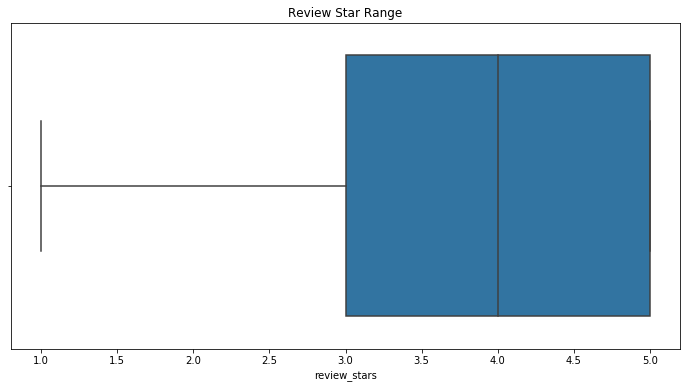

In [12]:
plt.figure(figsize=(12,6))
sns.boxplot('review_stars', data=user_review)
plt.title('Review Star Range')
plt.show()

In [13]:
user_counts['count'].describe()

count    174858.000000
mean          1.685785
std           2.576357
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max         243.000000
Name: count, dtype: float64

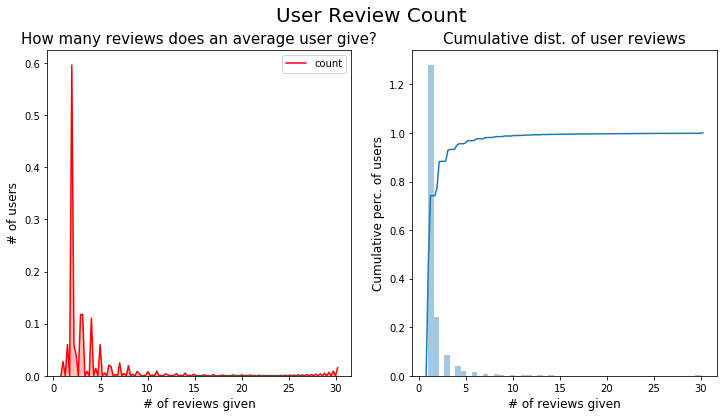

In [14]:
# visualize how many reviews a user gave
# only visualize the reviews a user giva less than 30 
user_counts.loc[user_counts['count']>30,'count']=30
plt.figure(figsize=(12,6))
plt.suptitle('User Review Count',fontsize=20)
# 
plt.subplot(1,2,1)
ax=sns.kdeplot(user_counts['count'],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('# of reviews given', fontsize=12)
plt.ylabel('# of users', fontsize=12)
# cululative distribution
plt.subplot(1,2,2)
sns.distplot(user_counts['count'],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)

plt.show()

Summary: There are 198728 unique users reviewed business in NV area and the average review they give is about 1.75 with average star3.82.

### 2. Business

In [15]:
zipcodes = reviews[['stars','postal_code','review_count']].dropna()
zipcodes['postal_code'] = zipcodes['postal_code'].astype(int).astype(str)
lookupData = reviews[['latitude','longitude','postal_code']].dropna()
lookupData['postal_code'] = lookupData['postal_code'].astype(int).astype(str)

In [16]:
count = zipcodes.groupby('postal_code').count()['review_count']
zipcodes_info = pd.merge(zipcodes.groupby('postal_code').agg(np.mean),count,on='postal_code',how='left')

In [17]:
zipcodes_info.columns = ['star','avg_review_count_for_a_business','business_count']
zipcodes_info

,star,avg_review_count_for_a_business,business_count
postal_code,,,
61462,2.500000,23.000000,23
89002,3.028316,200.973174,671
89005,4.064183,286.499713,1745
89011,3.426056,55.570423,142
89012,4.033495,366.133010,3090
...,...,...,...
89166,3.500000,130.000000,135
89169,3.957360,558.416844,5652
89178,3.351464,96.815900,717


In [18]:
zipcodes_info.describe()

,star,avg_review_count_for_a_business,business_count
count,63.000000,63.000000,63.000000
mean,3.516547,402.731211,4678.507937
std,0.465117,438.174507,10422.418449
min,1.950000,12.000000,13.000000
25%,3.239119,106.850679,438.500000
50%,3.637363,312.277778,1745.000000
75%,3.830010,565.853594,4526.500000
max,4.326494,2604.285908,79606.000000


There are 64 unique zip code area in the Nevada,each zip code area has 5457 resturants on average with mean star a business gets is 3.59 and on averge a resturant receives 405 reviews.

In [19]:
zipcodes_agg = pd.merge(zipcodes_info,
          lookupData.groupby('postal_code').first(),on='postal_code',how='inner')

In [20]:
zipcodes_agg.reset_index(inplace=True)

In [21]:

map = folium.Map(location=[36.1, -115], default_zoom_start=12)
map.choropleth(geo_data="nv.json", # nv geojson from githuba
             data=zipcodes_agg, # my dataset
             columns=['postal_code', 'business_count'], # zip code is here for matching the geojson zipcode, sales price is the column that changes the color of zipcode areas
             key_on='feature.properties.ZCTA5CE10', # this path contains zipcodes in str type, this zipcodes should match with our ZIP CODE column
             fill_color='BuPu', fill_opacity=0.7, line_opacity=0.3,
             legend_name='Business Number')

marker_cluster = MarkerCluster().add_to(map) # create marker clusters

for i in range(zipcodes_agg.shape[0]):
    location = [zipcodes_agg['longitude'][i],zipcodes_agg['latitude'][i]]
    tooltip = "Zipcode:{}<br> Area <br> Click for more".format(zipcodes_agg["postal_code"][i])
    
    folium.Marker(location, # adding more details to the popup screen using HTML
                  popup="""
                  <i>Mean Star: </i> <br> <b>${}</b> <br> 
                  <i>Average Review Count For A Business: </i><b><br>{}</b><br>""".format(
                    round(zipcodes_agg['star'][i],2), 
                    round(zipcodes_agg['avg_review_count_for_a_business'][i],2)), 
                  tooltip=tooltip).add_to(marker_cluster)
map

### Category

In [22]:
reviews['new_category'].value_counts()

American (New)        37226
Japanese              26794
Fast Food             25811
Delis                 23905
Breakfast & Brunch    23841
Mexican               22428
Steakhouses           21560
Bars                  20784
Pizza                 20441
European              17946
Italian               15073
SoutheastAsian        14142
Chinese               12634
DrinkDessert           6895
Seafood                5293
Name: new_category, dtype: int64

In [23]:
cl = reviews[reviews['new_category'].apply(lambda x: isinstance(x, str))]
category_list = list(cl['new_category'].values)
word = ''.join(category_list)

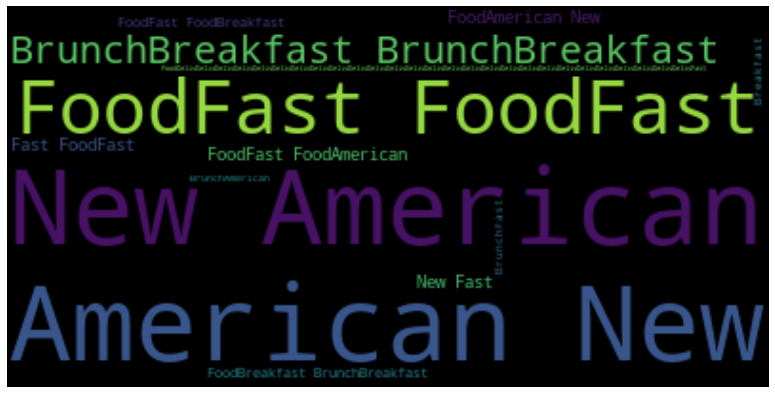

In [24]:
from wordcloud import WordCloud
plt.figure(figsize=(14,7))
wordcloud = WordCloud().generate(word)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

In [25]:
# only have the users with rated more than 5 times(25% data)
#create a new column that counts how many users rated resturants in Yelp
user_counts = reviews['user_id'].value_counts().to_frame().reset_index()
user_counts.columns = ['user_id','count']
all_user = reviews.merge(user_counts, on='user_id',how='left')
# only have the users with rated more than 5 times
user_rate_more_than_5 = all_user[all_user['count']>=5][['user_id','new_category','review_stars','count']]
user_rate_more_than_5.head()

,user_id,new_category,review_stars,count
1,HQF6pQ9mC52J3BEEDSevOw,Delis,1,10
3,DjisSyTr6hBOG9hVkrujmQ,Delis,4,26
5,8prr02BTumjFLYSLmMpO1Q,Delis,4,11
8,DjisSyTr6hBOG9hVkrujmQ,Delis,4,26
9,eH8-DE48eh6xXnoKc6_lnw,Delis,2,8


In [26]:
review_count = user_rate_more_than_5[['user_id','review_stars','new_category']].groupby(['user_id','new_category']).count().reset_index()
review_mean = user_rate_more_than_5[['user_id','review_stars','new_category']].groupby(['user_id','new_category']).mean().reset_index()
review_count['weighted_score'] = (review_count['review_stars'])*np.log(review_mean['review_stars']+1)
review_count.drop('review_stars',axis=1,inplace=True)

In [27]:
review_count

,user_id,new_category,weighted_score
0,---1lKK3aKOuomHnwAkAow,Bars,0.693147
1,---1lKK3aKOuomHnwAkAow,Delis,3.409496
2,---1lKK3aKOuomHnwAkAow,Fast Food,1.609438
3,---1lKK3aKOuomHnwAkAow,Japanese,0.693147
4,---1lKK3aKOuomHnwAkAow,Pizza,5.375278
...,...,...,...
44075,zzPvEodjvLPe-5NvV0U_cg,Fast Food,2.942488
44076,zzPvEodjvLPe-5NvV0U_cg,Japanese,4.158883
44077,zzPvEodjvLPe-5NvV0U_cg,Pizza,2.505526
44078,zzPvEodjvLPe-5NvV0U_cg,SoutheastAsian,1.609438


In [28]:
review_stars_mean = review_count.pivot_table(index=['user_id'],columns=['new_category'])
review_stars_mean

weighted_score                                         \
new_category           American (New)      Bars Breakfast & Brunch   Chinese   
user_id                                                                        
---1lKK3aKOuomHnwAkAow            NaN  0.693147                NaN       NaN   
--RlSfc-QmcHFGHyX6aVjA       1.791759       NaN           1.609438  1.386294   
-05XqtNjcBq19vh2CVJN8g       5.375278       NaN           1.791759  1.098612   
-0HhZbPBlB1YZx3BhAfaEA            NaN  1.791759                NaN  1.386294   
-16aKjco1c0RJ7c4U-q_Kw            NaN       NaN                NaN  1.609438   
...                               ...       ...                ...       ...   
zz25_Dsf99KnwTpdl4-PDQ            NaN       NaN                NaN       NaN   
zz9rIM0FmlWYvAzr6dGwVQ            NaN  0.693147           4.621335       NaN   
zzHSF3oCjXqgsYuVJPgdvw            NaN  1.098612                NaN       NaN   
zzMJLd3cWBM6HT8eMbOGbA            NaN       NaN                NaN       NaN   
zzPvEodjvLPe-5NvV0U_cg       4.158883  2.772589           6.118877  2.772589   

                                                                             \
new_category               Delis DrinkDessert  European Fast Food   Italian   
user_id                                                                       
---1lKK3aKOuomHnwAkAow  3.409496          NaN       NaN  1.609438       NaN   
--RlSfc-QmcHFGHyX6aVjA       NaN     1.386294       NaN       NaN       NaN   
-05XqtNjcBq19vh2CVJN8g  1.791759          NaN  1.791759  1.791759       NaN   
-0HhZbPBlB1YZx3BhAfaEA       NaN          NaN       NaN       NaN       NaN   
-16aKjco1c0RJ7c4U-q_Kw  1.609438          NaN       NaN       NaN       NaN   
...                          ...          ...       ...       ...       ...   
zz25_Dsf99KnwTpdl4-PDQ       NaN          NaN       NaN       NaN  3.218876   
zz9rIM0FmlWYvAzr6dGwVQ       NaN     0.693147       NaN       NaN       NaN   
zzHSF3oCjXqgsYuVJPgdvw       NaN          NaN       NaN       NaN       NaN   
zzMJLd3cWBM6HT8eMbOGbA       NaN          NaN       NaN       NaN       NaN   
zzPvEodjvLPe-5NvV0U_cg  1.386294     1.609438       NaN  2.942488       NaN   

                                                                               \
new_category            Japanese   Mexican     Pizza   Seafood SoutheastAsian   
user_id                                                                         
---1lKK3aKOuomHnwAkAow  0.693147       NaN  5.375278       NaN            NaN   
--RlSfc-QmcHFGHyX6aVjA  4.158883       NaN       NaN  4.828314            NaN   
-05XqtNjcBq19vh2CVJN8g       NaN       NaN       NaN       NaN            NaN   
-0HhZbPBlB1YZx3BhAfaEA       NaN  2.772589       NaN       NaN       1.386294   
-16aKjco1c0RJ7c4U-q_Kw       NaN  4.828314       NaN       NaN       1.791759   
...                          ...       ...       ...       ...            ...   
zz25_Dsf99KnwTpdl4-PDQ  3.218876       NaN       NaN       NaN            NaN   
zz9rIM0FmlWYvAzr6dGwVQ  0.693147       NaN  2.772589       NaN            NaN   
zzHSF3oCjXqgsYuVJPgdvw       NaN  7.175423       NaN       NaN            NaN   
zzMJLd3cWBM6HT8eMbOGbA  2.197225  1.098612  3.611918       NaN            NaN   
zzPvEodjvLPe-5NvV0U_cg  4.158883       NaN  2.505526       NaN       1.609438   

                                    
new_category           Steakhouses  
user_id                             
---1lKK3aKOuomHnwAkAow         NaN  
--RlSfc-QmcHFGHyX6aVjA         NaN  
-05XqtNjcBq19vh2CVJN8g         NaN  
-0HhZbPBlB1YZx3BhAfaEA         NaN  
-16aKjco1c0RJ7c4U-q_Kw         NaN  
...                            ...  
zz25_Dsf99KnwTpdl4-PDQ    2.505526  
zz9rIM0FmlWYvAzr6dGwVQ         NaN  
zzHSF3oCjXqgsYuVJPgdvw         NaN  
zzMJLd3cWBM6HT8eMbOGbA    1.386294  
zzPvEodjvLPe-5NvV0U_cg    3.897849  

[7762 rows x 15 columns]

Now, we can see there are 8033 unique users and for each, there is a rating for different category food. We create a low-dense dataset with many NaN values in the dataset.

In [29]:
review_stars_mean.columns = review_stars_mean.columns.droplevel()

In [30]:
#count nan value for each column in the dataset
nanCount = {}
for each in review_stars_mean.columns:
    nanCount[each] = review_stars_mean[each].isna().sum()

In [31]:
sorted(nanCount.items(), key=lambda x: x[1],reverse=True)

[('Seafood', 6678),
 ('DrinkDessert', 6193),
 ('SoutheastAsian', 5460),
 ('European', 5446),
 ('Italian', 5420),
 ('Chinese', 5415),
 ('Steakhouses', 4837),
 ('Bars', 4539),
 ('Pizza', 4449),
 ('Mexican', 4426),
 ('Breakfast & Brunch', 4239),
 ('Japanese', 4049),
 ('Fast Food', 3881),
 ('Delis', 3758),
 ('American (New)', 3560)]

In [32]:
review_stars_mean.fillna(0, inplace=True)

In [33]:
review_stars_mean.isna().sum()

new_category
American (New)        0
Bars                  0
Breakfast & Brunch    0
Chinese               0
Delis                 0
DrinkDessert          0
European              0
Fast Food             0
Italian               0
Japanese              0
Mexican               0
Pizza                 0
Seafood               0
SoutheastAsian        0
Steakhouses           0
dtype: int64

In [34]:
review_stars_mean.shape

(7762, 15)

9817 customers with 148 different resturant categories

# K Means

choose the opitimal clusters

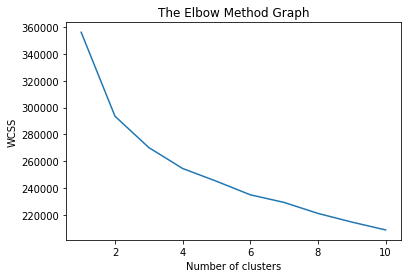

In [35]:
# optimal numbers of clusters
wcss = []
for i in range(1,11): 
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )
    kmeans.fit(review_stars_mean)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [36]:
kmeans_cluster = KMeans(n_clusters=4, random_state=123)
# Fit model
%timeit kmeans_cluster.fit(review_stars_mean)
y_pred = kmeans_cluster.predict(review_stars_mean)

223 ms ± 3.09 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


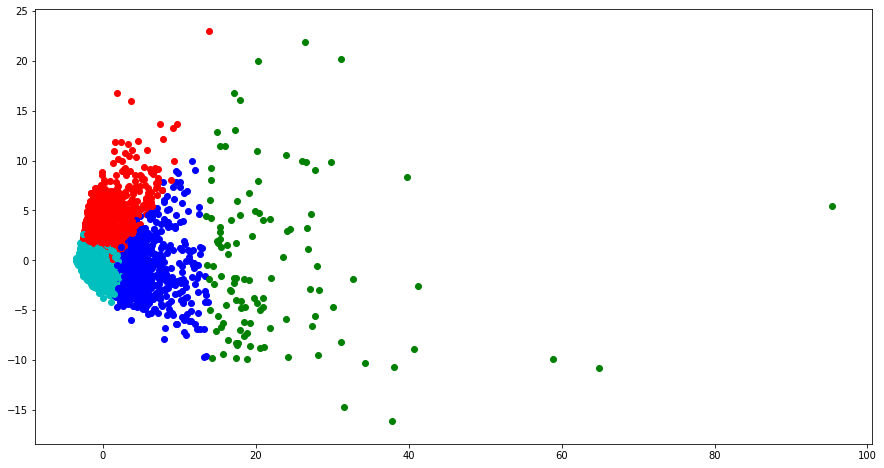

In [37]:
pca = PCA(n_components=2).fit_transform(review_stars_mean)
plt.figure(figsize=(15,8))
colours = ['r','g','b','c','y','gold','orange','m']
for i in range(pca.shape[0]):
    plt.scatter(pca[i, 0], pca[i, 1],
             color=colours[y_pred[i]])

In [38]:
labels_4 = KMeans(n_clusters=4, random_state=123).fit_predict(review_stars_mean)
labels_5 = KMeans(n_clusters=5, random_state=123).fit_predict(review_stars_mean)
labels_7 = KMeans(n_clusters=7, random_state=123).fit_predict(review_stars_mean)
labels_6 = KMeans(n_clusters=6, random_state=123).fit_predict(review_stars_mean)
labels_8 = KMeans(n_clusters=8, random_state=123).fit_predict(review_stars_mean)
print('The silhouette coefficient for 4 cluster is {}'.format(metrics.silhouette_score(review_stars_mean,labels_4,metric='euclidean')))
print('The silhouette coefficient for 6 cluster is {}'.format(metrics.silhouette_score(review_stars_mean,labels_6,metric='euclidean')))
print('The silhouette coefficient for 5 cluster is {}'.format(metrics.silhouette_score(review_stars_mean,labels_5,metric='euclidean')))
print('The silhouetee coefficient for 7 cluster is {}'.format(metrics.silhouette_score(review_stars_mean,labels_7,metric='euclidean')))
print('The silhouetee coefficient for 8 cluster is {}'.format(metrics.silhouette_score(review_stars_mean,labels_8,metric='euclidean')))

The silhouette coefficient for 4 cluster is 0.15765503503878428
The silhouette coefficient for 6 cluster is 0.08031759428369936
The silhouette coefficient for 5 cluster is 0.15886602752340306
The silhouetee coefficient for 7 cluster is 0.09148234034881138
The silhouetee coefficient for 8 cluster is 0.09080493858809331


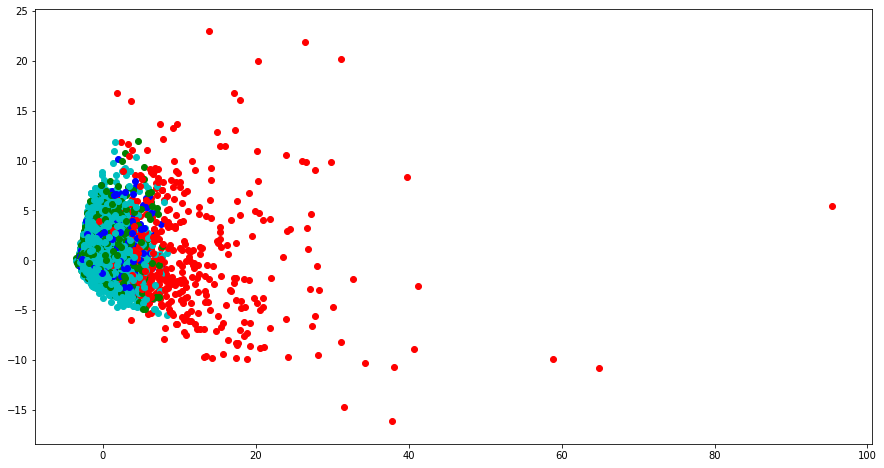

In [39]:
from sklearn.mixture import GaussianMixture
gmm_cluster = GaussianMixture(n_components=4, random_state=33)
gmm_clusters = gmm_cluster.fit_predict(review_stars_mean)
plt.figure(figsize=(15,8))
for i in range(pca.shape[0]):
    plt.scatter(pca[i, 0], pca[i, 1],
             color=colours[gmm_clusters[i]])

In [40]:
print('The silhouette coefficient for 4 GMM cluster is {}'.
      format(metrics.silhouette_score(review_stars_mean,gmm_clusters,metric='euclidean')))

The silhouette coefficient for 4 GMM cluster is 0.02331690114136387


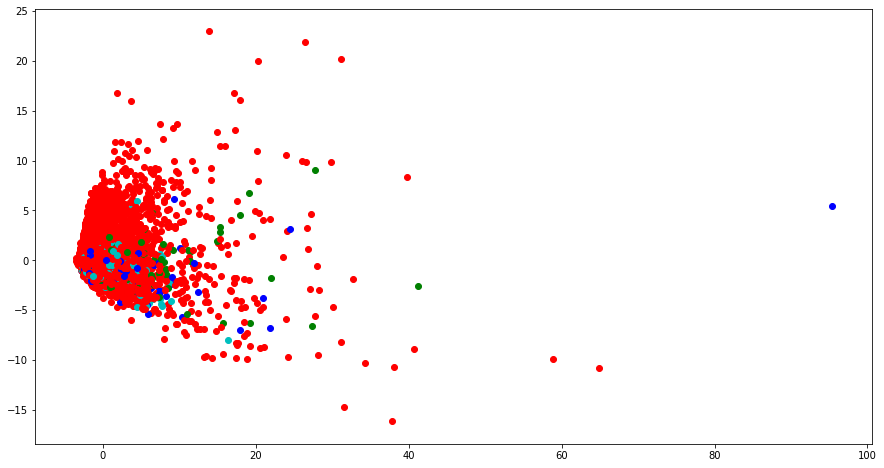

In [41]:

from sklearn.cluster import AgglomerativeClustering
agg_cluster_com = AgglomerativeClustering(n_clusters=4,linkage='complete',affinity='cosine')
complete_clusters = agg_cluster_com.fit_predict(review_stars_mean)
plt.figure(figsize=(15,8))
colours = ['r','g','b','c']
for i in range(pca.shape[0]):
    plt.scatter(pca[i, 0], pca[i, 1],
             color=colours[complete_clusters[i]])

In [42]:
print('The silhouette coefficient for 4 hierarchical cluster is {}'.
      format(metrics.silhouette_score(review_stars_mean,complete_clusters,metric='euclidean')))

The silhouette coefficient for 4 hierarchical cluster is -0.01939161136765001


In [43]:
review_stars_mean['cluster'] = labels_4
review_stars_mean

new_category,American (New),Bars,Breakfast & Brunch,Chinese,Delis,DrinkDessert,European,Fast Food,Italian,Japanese,Mexican,Pizza,Seafood,SoutheastAsian,Steakhouses,cluster
user_id,,,,,,,,,,,,,,,,
---1lKK3aKOuomHnwAkAow,0.000000,0.693147,0.000000,0.000000,3.409496,0.000000,0.000000,1.609438,0.000000,0.693147,0.000000,5.375278,0.000000,0.000000,0.000000,3
--RlSfc-QmcHFGHyX6aVjA,1.791759,0.000000,1.609438,1.386294,0.000000,1.386294,0.000000,0.000000,0.000000,4.158883,0.000000,0.000000,4.828314,0.000000,0.000000,0
-05XqtNjcBq19vh2CVJN8g,5.375278,0.000000,1.791759,1.098612,1.791759,0.000000,1.791759,1.791759,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3
-0HhZbPBlB1YZx3BhAfaEA,0.000000,1.791759,0.000000,1.386294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.772589,0.000000,0.000000,1.386294,0.000000,3
-16aKjco1c0RJ7c4U-q_Kw,0.000000,0.000000,0.000000,1.609438,1.609438,0.000000,0.000000,0.000000,0.000000,0.000000,4.828314,0.000000,0.000000,1.791759,0.000000,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zz25_Dsf99KnwTpdl4-PDQ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.218876,3.218876,0.000000,0.000000,0.000000,0.000000,2.505526,0
zz9rIM0FmlWYvAzr6dGwVQ,0.000000,0.693147,4.621335,0.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.693147,0.000000,2.772589,0.000000,0.000000,0.000000,3
zzHSF3oCjXqgsYuVJPgdvw,0.000000,1.098612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.175423,0.000000,0.000000,0.000000,0.000000,3


In [44]:
review_stars_mean['cluster'].value_counts()

3    5625
0    1305
2     721
1     111
Name: cluster, dtype: int64

K-means shows a better cluster

# Cluster Analysis

In [45]:
review_stars_mean.columns

Index(['American (New)', 'Bars', 'Breakfast & Brunch', 'Chinese', 'Delis',
       'DrinkDessert', 'European', 'Fast Food', 'Italian', 'Japanese',
       'Mexican', 'Pizza', 'Seafood', 'SoutheastAsian', 'Steakhouses',
       'cluster'],
      dtype='object', name='new_category')

In [46]:
review_stars_mean

new_category,American (New),Bars,Breakfast & Brunch,Chinese,Delis,DrinkDessert,European,Fast Food,Italian,Japanese,Mexican,Pizza,Seafood,SoutheastAsian,Steakhouses,cluster
user_id,,,,,,,,,,,,,,,,
---1lKK3aKOuomHnwAkAow,0.000000,0.693147,0.000000,0.000000,3.409496,0.000000,0.000000,1.609438,0.000000,0.693147,0.000000,5.375278,0.000000,0.000000,0.000000,3
--RlSfc-QmcHFGHyX6aVjA,1.791759,0.000000,1.609438,1.386294,0.000000,1.386294,0.000000,0.000000,0.000000,4.158883,0.000000,0.000000,4.828314,0.000000,0.000000,0
-05XqtNjcBq19vh2CVJN8g,5.375278,0.000000,1.791759,1.098612,1.791759,0.000000,1.791759,1.791759,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3
-0HhZbPBlB1YZx3BhAfaEA,0.000000,1.791759,0.000000,1.386294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.772589,0.000000,0.000000,1.386294,0.000000,3
-16aKjco1c0RJ7c4U-q_Kw,0.000000,0.000000,0.000000,1.609438,1.609438,0.000000,0.000000,0.000000,0.000000,0.000000,4.828314,0.000000,0.000000,1.791759,0.000000,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zz25_Dsf99KnwTpdl4-PDQ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.218876,3.218876,0.000000,0.000000,0.000000,0.000000,2.505526,0
zz9rIM0FmlWYvAzr6dGwVQ,0.000000,0.693147,4.621335,0.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.693147,0.000000,2.772589,0.000000,0.000000,0.000000,3
zzHSF3oCjXqgsYuVJPgdvw,0.000000,1.098612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.175423,0.000000,0.000000,0.000000,0.000000,3


In [47]:
cluster_value = pd.melt(review_stars_mean,id_vars=['cluster'],value_vars=['American (New)', 'Bars', 'Breakfast & Brunch', 'Chinese', 'Delis',
       'DrinkDessert', 'European', 'Fast Food', 'Italian', 'Japanese',
       'Mexican', 'Pizza', 'Seafood', 'SoutheastAsian', 'Steakhouses'])

In [48]:
cluster_value

,cluster,new_category,value
0,3,American (New),0.000000
1,0,American (New),1.791759
2,3,American (New),5.375278
3,3,American (New),0.000000
4,3,American (New),0.000000
...,...,...,...
116425,0,Steakhouses,2.505526
116426,3,Steakhouses,0.000000
116427,3,Steakhouses,0.000000
116428,3,Steakhouses,1.386294


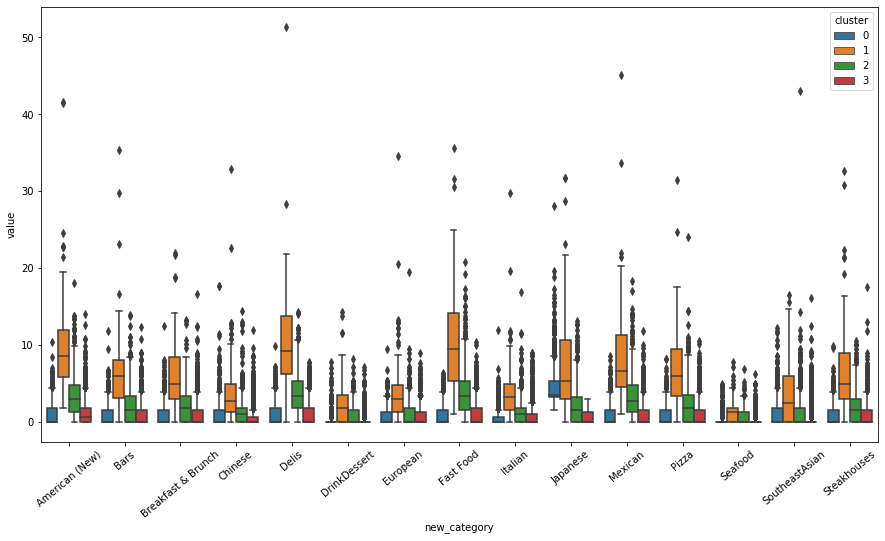

In [49]:
plt.figure(figsize=(15,8))
sns.boxplot(x='new_category',y='value',data=cluster_value,hue = 'cluster')
plt.xticks(rotation = 40)
plt.show()

From this chart, we clearly see that customers from cluster1 is the group of the people who love all kinds of food and love gaving reviews on Yelp.

In [50]:
#category over each cluster
cluster0 = review_stars_mean[review_stars_mean['cluster']==0]
cluster1 = review_stars_mean[review_stars_mean['cluster']==1]
cluster2 = review_stars_mean[review_stars_mean['cluster']==2]
cluster3 = review_stars_mean[review_stars_mean['cluster']==3]
print('Cluster 0 has {} users, cluster 1 has {} users, cluster 2 has {} users, cluster 3 has {} users'.format(len(cluster0),len(cluster1), len(cluster2), len(cluster3)))

Cluster 0 has 1305 users, cluster 1 has 111 users, cluster 2 has 721 users, cluster 3 has 5625 users


In [51]:
cluster0_total = cluster0.sum(axis=0).to_frame().reset_index()
cluster0_total.columns = ['category','weighted_score_sum']
cluster1_total = cluster1.sum(axis=0).to_frame().reset_index()
cluster1_total.columns = ['category','weighted_score_sum']
cluster2_total = cluster2.sum(axis=0).to_frame().reset_index()
cluster2_total.columns = ['category','weighted_score_sum']
cluster3_total = cluster3.sum(axis=0).to_frame().reset_index()
cluster3_total.columns = ['category','weighted_score_sum']

In [53]:

cluster0.drop('cluster',axis=1,inplace=True)
cluster1.drop('cluster',axis=1,inplace=True)
cluster2.drop('cluster',axis=1,inplace=True)
cluster3.drop('cluster',axis=1,inplace=True)

In [54]:
cluster0

new_category,American (New),Bars,Breakfast & Brunch,Chinese,Delis,DrinkDessert,European,Fast Food,Italian,Japanese,Mexican,Pizza,Seafood,SoutheastAsian,Steakhouses
user_id,,,,,,,,,,,,,,,
--RlSfc-QmcHFGHyX6aVjA,1.791759,0.000000,1.609438,1.386294,0.000000,1.386294,0.000000,0.000000,0.000000,4.158883,0.000000,0.000000,4.828314,0.000000,0.000000
-2gOxVWcnBr5DclrrsWXCA,1.609438,0.000000,1.609438,1.098612,0.000000,1.386294,1.791759,0.000000,0.000000,3.218876,3.218876,0.000000,0.000000,1.609438,0.000000
-4JDJeFS0YAYSiSvIshGLQ,0.000000,0.000000,1.609438,0.000000,0.000000,0.000000,0.000000,2.772589,0.000000,7.408023,4.399011,1.098612,1.609438,1.609438,1.386294
-594af_E7Z9VVjQc9pJK3g,0.000000,1.609438,0.693147,0.000000,1.386294,3.218876,0.000000,0.000000,0.000000,3.409496,1.609438,0.000000,0.000000,0.000000,0.000000
-7bM_DeL2Kj2CuYuVDsLNg,0.000000,0.000000,0.000000,0.000000,1.791759,0.000000,0.000000,0.000000,1.098612,8.798022,0.693147,1.386294,0.000000,0.000000,3.409496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zZtC3Sx0wUCT0ilBKnkyHg,0.000000,0.000000,0.000000,1.609438,0.000000,0.000000,0.000000,0.000000,3.583519,3.409496,0.000000,0.000000,1.791759,0.000000,0.000000
zfP7JESA_WfKvNQzYJDa7g,1.609438,0.000000,5.021929,0.000000,0.693147,1.609438,5.021929,0.000000,0.000000,3.583519,3.583519,3.218876,0.000000,0.000000,0.000000
zfZSq6rWFkWlQuQex-YrCA,0.000000,0.000000,0.000000,0.000000,1.386294,1.791759,0.000000,1.386294,0.000000,6.996799,0.000000,1.791759,0.000000,0.000000,1.791759


In [55]:
cluster0.shape[0]

1305

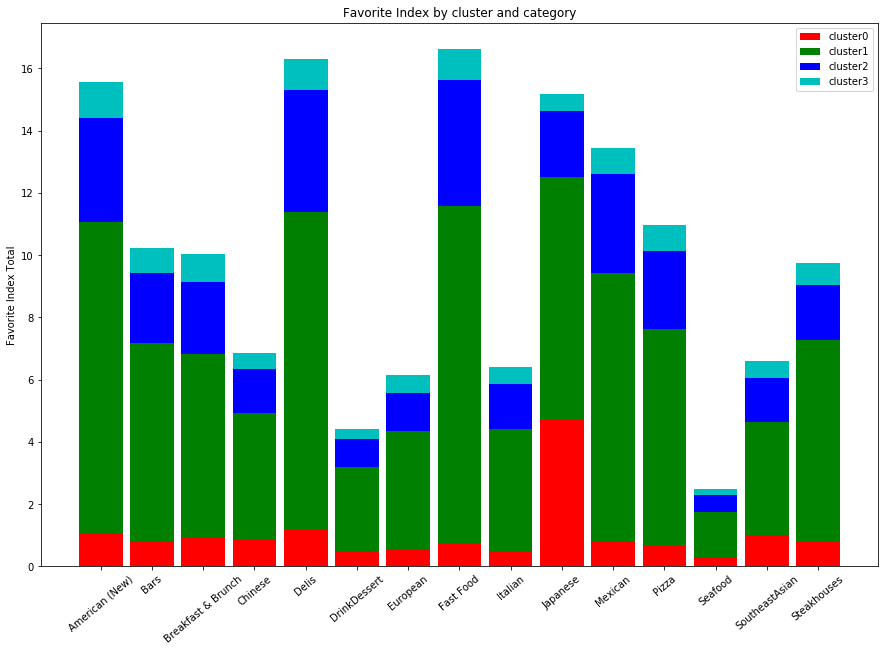

In [56]:

plt.figure(figsize=(15,10))
N = 15
cluster0_sum = cluster0.sum(axis=0)/cluster0.shape[0]#the average fav score of users per cluster for each category
cluster1_sum = cluster1.sum(axis=0)/cluster1.shape[0]
cluster2_sum = cluster2.sum(axis=0)/cluster2.shape[0]
cluster3_sum = cluster3.sum(axis=0)/cluster3.shape[0]
ind = np.arange(N)    # the x locations for the groups
width = 0.85       # the width of the bars: can also be len(x) sequence
p1 = plt.bar(ind, cluster0_sum, width,color='r')
p2 = plt.bar(ind, cluster1_sum, width, color='g',
             bottom=cluster0_sum)
p3 = plt.bar(ind, cluster2_sum, width, color='b',
             bottom=cluster1_sum+cluster0_sum)
p4 = plt.bar(ind, cluster3_sum, width,color='c',
             bottom=cluster2_sum+cluster1_sum+cluster0_sum)
plt.ylabel('Favorite Index Total')
plt.title('Favorite Index by cluster and category')
plt.xticks(ind, ('American (New)', 'Bars', 'Breakfast & Brunch', 'Chinese', 'Delis','DrinkDessert','European','Fast Food','Italian','Japanese','Mexican','Pizza','Seafood','SoutheastAsian','Steakhouses'))
#plt.yticks(np.arange(0, 81, 10))
plt.legend((p1[0], p2[0],p3[0],p4[0]), ('cluster0', 'cluster1','cluster2','cluster3'))
plt.xticks(rotation = 40)
plt.show()

Top 5 favoriate categories(by frequency and rating):  Fast Food, Delis, American(New), Japanese and Mexican food in NV. Let's have look at the proportion of each cluster for each category.Cluster 1 has an overall high favorite index for all categories.

In [62]:
review_stars_mean

new_category,American (New),Bars,Breakfast & Brunch,Chinese,Delis,DrinkDessert,European,Fast Food,Italian,Japanese,Mexican,Pizza,Seafood,SoutheastAsian,Steakhouses
user_id,,,,,,,,,,,,,,,
---1lKK3aKOuomHnwAkAow,0.000000,0.693147,0.000000,0.000000,3.409496,0.000000,0.000000,1.609438,0.000000,0.693147,0.000000,5.375278,0.000000,0.000000,0.000000
--RlSfc-QmcHFGHyX6aVjA,1.791759,0.000000,1.609438,1.386294,0.000000,1.386294,0.000000,0.000000,0.000000,4.158883,0.000000,0.000000,4.828314,0.000000,0.000000
-05XqtNjcBq19vh2CVJN8g,5.375278,0.000000,1.791759,1.098612,1.791759,0.000000,1.791759,1.791759,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
-0HhZbPBlB1YZx3BhAfaEA,0.000000,1.791759,0.000000,1.386294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.772589,0.000000,0.000000,1.386294,0.000000
-16aKjco1c0RJ7c4U-q_Kw,0.000000,0.000000,0.000000,1.609438,1.609438,0.000000,0.000000,0.000000,0.000000,0.000000,4.828314,0.000000,0.000000,1.791759,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zz25_Dsf99KnwTpdl4-PDQ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.218876,3.218876,0.000000,0.000000,0.000000,0.000000,2.505526
zz9rIM0FmlWYvAzr6dGwVQ,0.000000,0.693147,4.621335,0.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.693147,0.000000,2.772589,0.000000,0.000000,0.000000
zzHSF3oCjXqgsYuVJPgdvw,0.000000,1.098612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.175423,0.000000,0.000000,0.000000,0.000000


In [73]:
(cluster1.sum(axis=0))/(cluster1.shape[0])

new_category
American (New)         9.995701
Bars                   6.353406
Breakfast & Brunch     5.872245
Chinese                4.063393
Delis                 10.225372
DrinkDessert           2.707868
European               3.798434
Fast Food             10.831965
Italian                3.916190
Japanese               7.770972
Mexican                8.662063
Pizza                  6.931832
Seafood                1.485300
SoutheastAsian         3.619994
Steakhouses            6.461279
dtype: float64

In [68]:
cluster2.shape[0]

721

In [69]:
cluster3.shape[0]

5625

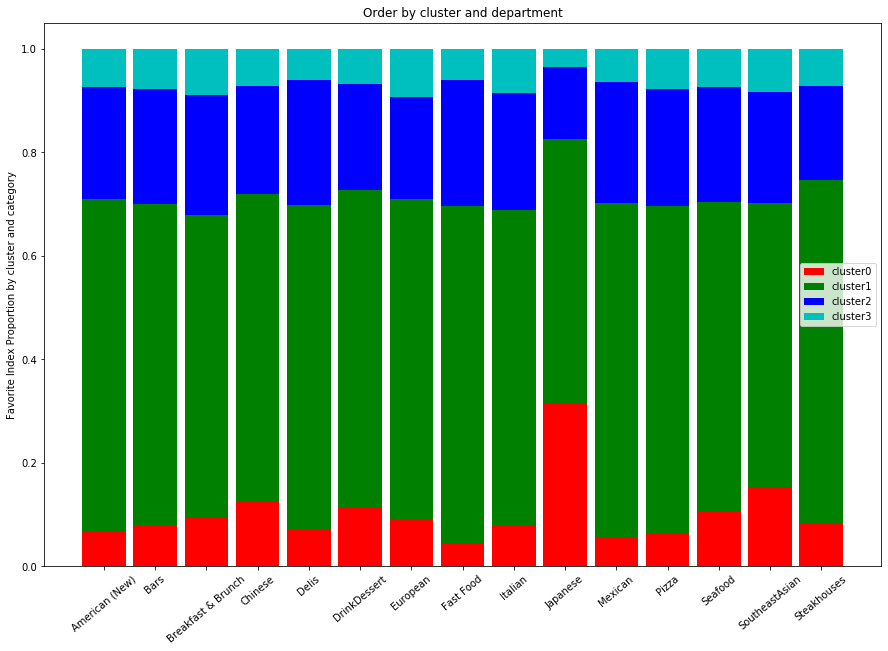

In [76]:
plt.figure(figsize=(15,10))
N = 15
#review_stars_mean.drop('cluster',axis=1,inplace=True)
total =  cluster0.sum(axis=0)/cluster0.shape[0]+cluster1.sum(axis=0)/cluster1.shape[0]+cluster2.sum(axis=0)/cluster2.shape[0]+cluster3.sum(axis=0)/cluster3.shape[0]
avg = review_stars_mean.sum(axis=0)/review_stars_mean.shape[0]
cluster0_percentage = (cluster0.sum(axis=0)/cluster0.shape[0])/total
cluster1_percentage =  (cluster1.sum(axis=0)/cluster1.shape[0])/total
cluster2_percentage =  (cluster2.sum(axis=0)/cluster2.shape[0])/total
cluster3_percentage =  (cluster3.sum(axis=0)/cluster3.shape[0])/total
ind = np.arange(N)    # the x locations for the groups
width = 0.85       # the width of the bars: can also be len(x) sequence
p1 = plt.bar(ind, cluster0_percentage, width,color='r')
p2 = plt.bar(ind, cluster1_percentage, width, color='g',
             bottom=cluster0_percentage)
p3 = plt.bar(ind, cluster2_percentage, width, color='b',
            bottom=cluster1_percentage+cluster0_percentage)
p4 = plt.bar(ind, cluster3_percentage, width,color='c',
             bottom=cluster2_percentage+cluster1_percentage+cluster0_percentage)
plt.ylabel('Favorite Index Proportion by cluster and category')
plt.title('Order by cluster and department')
plt.xticks(ind, ('American (New)', 'Bars', 'Breakfast & Brunch', 'Chinese', 'Delis','DrinkDessert','European','Fast Food','Italian','Japanese','Mexican','Pizza','Seafood','SoutheastAsian','Steakhouses'))
#plt.yticks(np.arange(0, 1, 0.01))
plt.legend((p1[0],p2[0],p3[0],p4[0]), ('cluster0', 'cluster1','cluster2','cluster3'))
plt.xticks(rotation = 40)
plt.show()

Cluster 0 is the group of people who love Asian food especially japanese(Top three: Japannese, Southern Asian and Chinese). Cluster 1 is the group of people who show the most interest in each category. Cluster2 are the group of people who show the similar interet in each category. Group 3 are the group of users who show least interst in each category(least active users), which is the majority users(72.5% users).

# Prediction & Recommendation

In [79]:
# pick a random user:0hZfE2He1YssM_wEvKhfcA from this cluster and predict the rating for Italian food
ItalianFood = cluster1[cluster1['Italian']!=0]
avg_ItalianFood = ItalianFood['Italian'].sum()/ItalianFood.shape[0]
print('The Italian food favorite index score prediction for user 0hZfE2He1YssM_wEvKhfcA is {}'.format(round(avg_ItalianFood,3)))

The Italian food favorite index score prediction for user 0hZfE2He1YssM_wEvKhfcA is 4.624


In [80]:
#avgRatingList = {}
#times = {}
#for each in cluster1.columns:
#    times[each] = cluster1[cluster1[each]!=0][each].shape[0]
#    if (cluster1[cluster1[each]!=0].shape[0]) == 0:avgRatingList[each] = 0
#   else:avgRatingList[each] = round(sum(cluster1[cluster1[each]!=0][each])/(cluster1[cluster1[each]!=0].shape[0]),3)

In [81]:
#sorted(times.items(), key=lambda x: x[1],reverse=True)

[('American (New)', 111),
 ('Fast Food', 111),
 ('Mexican', 111),
 ('Delis', 110),
 ('Pizza', 107),
 ('Breakfast & Brunch', 104),
 ('Bars', 101),
 ('Japanese', 100),
 ('Steakhouses', 100),
 ('Italian', 94),
 ('Chinese', 92),
 ('European', 89),
 ('DrinkDessert', 77),
 ('SoutheastAsian', 77),
 ('Seafood', 66)]

In [84]:
# calculate 'favorite degree' = times^e * avg_score, the time a cutomer visit a specific resturant is more important than the rating she gives out
fav_score = {}
for each in cluster1.columns:
    fav_score[each] = np.mean(cluster1[cluster1[each]!=0][each])

In [85]:
sorted(fav_score.items(), key=lambda x: x[1],reverse=True)

[('Fast Food', 10.831964917113995),
 ('Delis', 10.318330023892699),
 ('American (New)', 9.99570064320697),
 ('Mexican', 8.662062584108341),
 ('Japanese', 8.625778737216114),
 ('Pizza', 7.190965473277221),
 ('Steakhouses', 7.1720197754629895),
 ('Bars', 6.982456046067592),
 ('Breakfast & Brunch', 6.267491883970876),
 ('SoutheastAsian', 5.218433365051532),
 ('Chinese', 4.902571922871206),
 ('European', 4.737372620580896),
 ('Italian', 4.624437312843346),
 ('DrinkDessert', 3.9035501813001843),
 ('Seafood', 2.498005372204123)]

So people from cluster 1 are the group of people who especially love Fast Food, Delis and American(New) food.

# Conclusion

We cluster the users reviewed 5 more times into 4 groups using kmeans and visualize them into 2D plot. By doing the cluster analysis, we can identify and characteristics a cluster shares and provide custimized service to different groups. For example for users in group one(Asian food lover), Yelp can provide more Asian food recommendation near them.

Next step: This project only uses content based filtering model, using users similarity to group users and mke recommendation. For next step, I'll try to make prediction using Neural Networkt and add more features from customer reviews(text)using NLP.